In [609]:
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.preprocessing import StandardScaler

import time
from sklearn.svm import LinearSVC
from skimage.feature import hog
from sklearn.model_selection import train_test_split

from vd.feat_ext import FeatureExtracter
from vd.agent import VehicleDetectAgent
from vd.env import VehicleDetectionEnv

In [610]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [611]:
fn_vehicles = glob.glob("../../../data/vehicle_detection/vehicles/*/*.png")
fn_non_vehicles = glob.glob("../../../data/vehicle_detection/non-vehicles/*/*.png")

env = VehicleDetectionEnv()
env.attach(fn_vehicles, VehicleDetectionEnv.ACTION_CAR)
env.attach(fn_non_vehicles, VehicleDetectionEnv.ACTION_NOT_CAR)

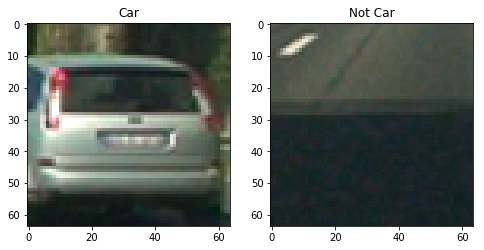

In [612]:
def draw_training_data():
    plt.figure(figsize=(8, 4))
    img = env.state(env.ACTION_CAR, -1)
    plt.subplot(1, 2, 1)
    plt.title("Car")
    plt.imshow(img)

    img = env.state(env.ACTION_NOT_CAR, -1)
    plt.subplot(1, 2, 2)
    plt.title("Not Car")
    plt.imshow(img)
    plt.savefig("./output_images/training_data.png")
    plt.show()
    
draw_training_data()

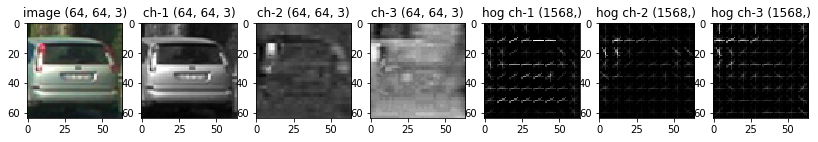

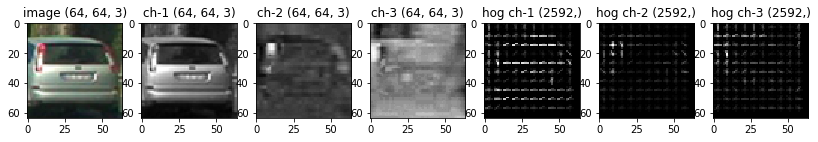

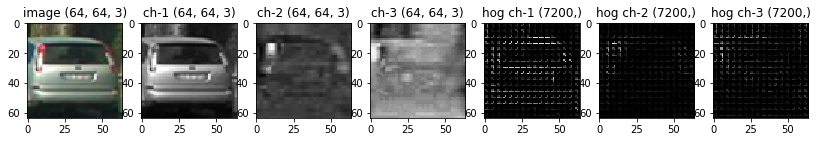

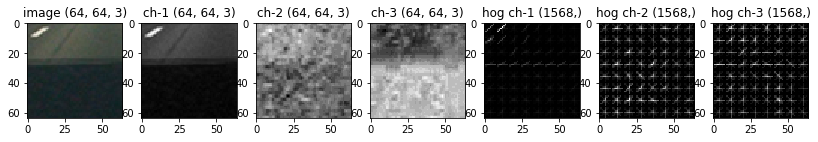

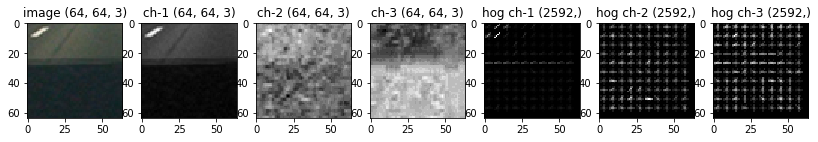

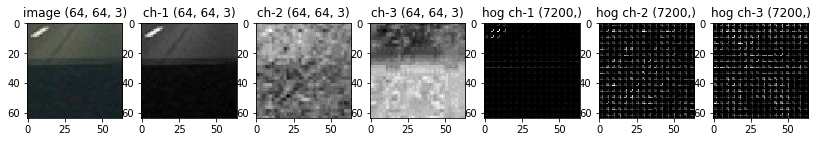

In [614]:
def draw_hog(img, orient, pix_per_cell, cell_per_block, cat):
    plt.figure(figsize=(14, 10))
    feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)

    plt.subplot(1,7,1)
    plt.title("image {0}".format(img.shape))
    plt.imshow(img)

    plt.subplot(1,7,2)
    plt.title("ch-1 {0}".format(feature_image.shape))
    plt.imshow(feature_image[:,:,0], cmap='gray')

    plt.subplot(1,7,3)
    plt.title("ch-2 {0}".format(feature_image.shape))
    plt.imshow(feature_image[:,:,1], cmap='gray')
    
    plt.subplot(1,7,4)
    plt.title("ch-3 {0}".format(feature_image.shape))
    plt.imshow(feature_image[:,:,2], cmap='gray')

    (feat, hog_img) = FeatureExtracter._hog(feature_image[:,:,0], orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, vis=True)
    plt.subplot(1,7,5)
    plt.title("hog ch-1 {0}".format(feat.shape))
    plt.imshow(hog_img, cmap='gray')

    (feat, hog_img) = FeatureExtracter._hog(feature_image[:,:,1], orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, vis=True)
    plt.subplot(1,7,6)
    plt.title("hog ch-2 {0}".format(feat.shape))
    plt.imshow(hog_img, cmap='gray')

    (feat, hog_img) = FeatureExtracter._hog(feature_image[:,:,2], orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, vis=True)
    plt.subplot(1,7,7)
    plt.title("hog ch-3 {0}".format(feat.shape))
    plt.imshow(hog_img, cmap='gray')
    plt.savefig("./output_images/hog_{0}.png".format(cat), bbox_inches = "tight")
    plt.show()

    
img = env.state(env.ACTION_CAR, -1)
#feature_image = img
draw_hog(img, 8, 8, 2, "car_882")
draw_hog(img, 8, 6, 2, "car_862")
draw_hog(img, 8, 4, 2, "car_842")

img = env.state(env.ACTION_NOT_CAR, -1)
#feature_image = img
draw_hog(img, 8, 8, 2, "not_car_882")
draw_hog(img, 8, 6, 2, "not_car_862")
draw_hog(img, 8, 4, 2, "not_car_842")

In [39]:
agent = VehicleDetectAgent(env)
agent.imitate(env.observation())

In [41]:
agent.save()

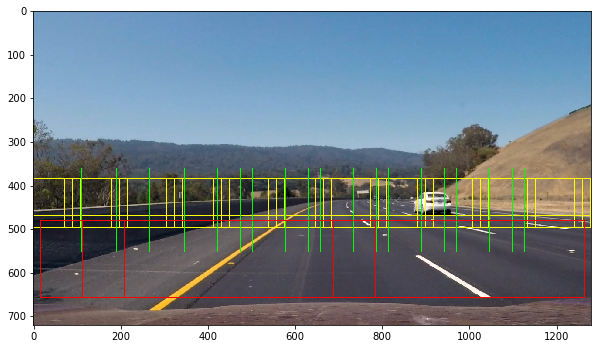

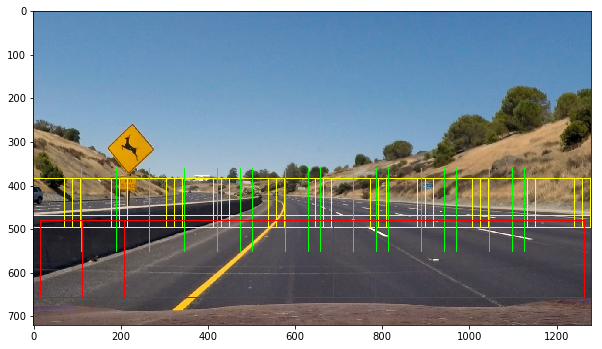

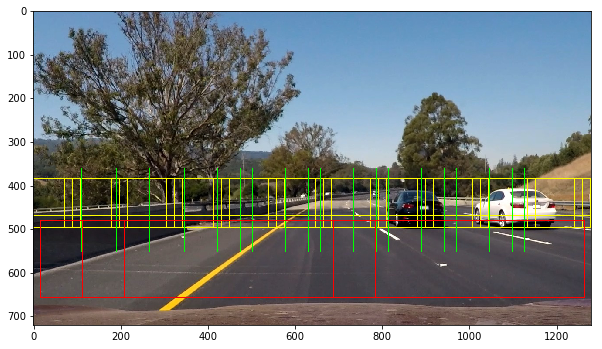

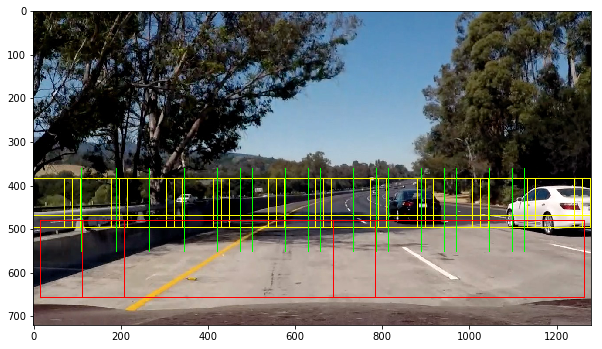

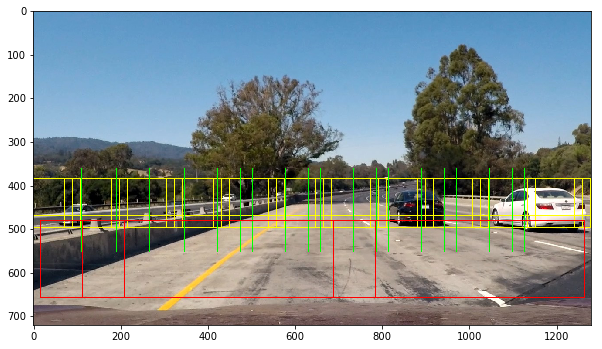

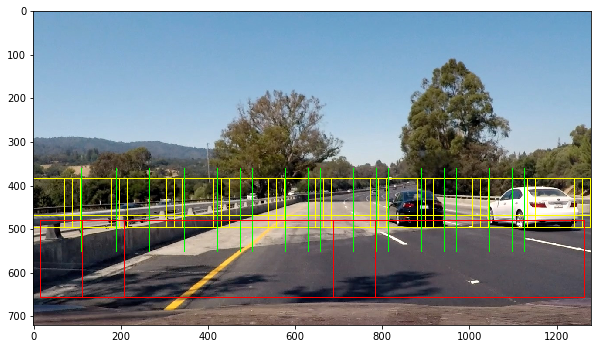

In [536]:
test_images = glob.glob("./test_images/test*.jpg")
env = VehicleDetectionEnv()
env.reset()
env.attach(test_images)
i = 0
for img, _, _ in env.observation():
    windows = []
    height, width, _ = img.shape
    part = Partitioner()
    windows = part._partition(width, height, xy_window = (72, 56), x_start_stop=[None, None], y_start_stop=[int(height/2)+24, int(height/2+72*2)], xy_overlap=(0.75, 0.5))
    for win in windows:
        img = cv2.rectangle(img, win[0], win[1], (255,255,0), 1)
    
    windows = part._partition(width, height, xy_window = (132, 96), x_start_stop=[7, None], y_start_stop=[int(height/2), int(height/2+96*2)], xy_overlap=(0.6, 0.5))
    for win in windows:
        img = cv2.rectangle(img, win[0], win[1], (0,255,0), 1)
    
    windows = part._partition(width, height, xy_window = (192, 176), x_start_stop=[17, None], y_start_stop=[int(height*2/3), int(height*2/3+96*2)], xy_overlap=(0.5, 0.5))
    for win in windows:
        img = cv2.rectangle(img, win[0], win[1], (255,0,0), 1)
    
    plt.figure(figsize=(10,7))
    plt.imshow(img)
    cv2.imwrite("./output_images/slid_win_{0}.png".format(i), cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    plt.show()
    i += 1

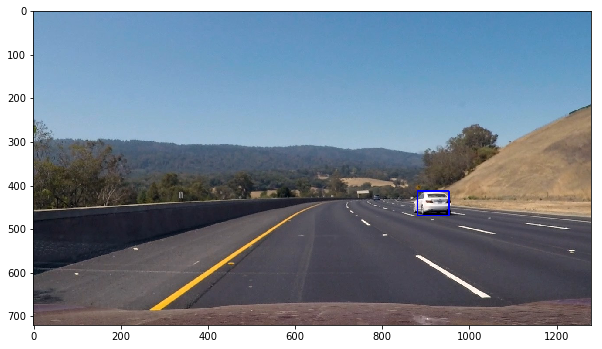

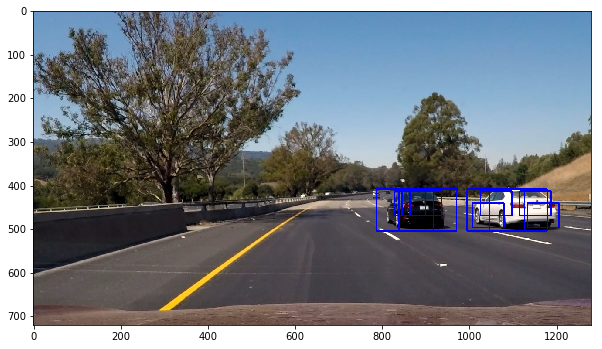

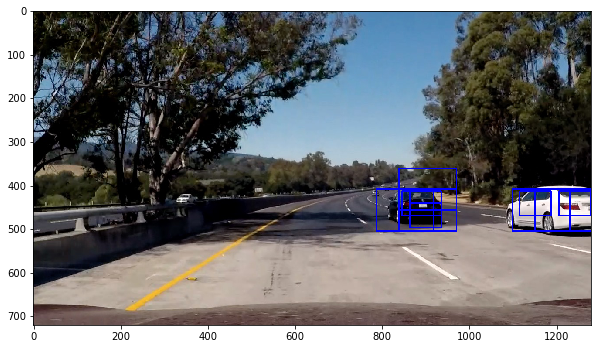

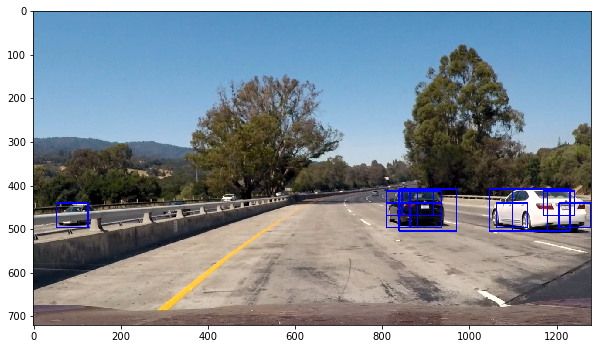

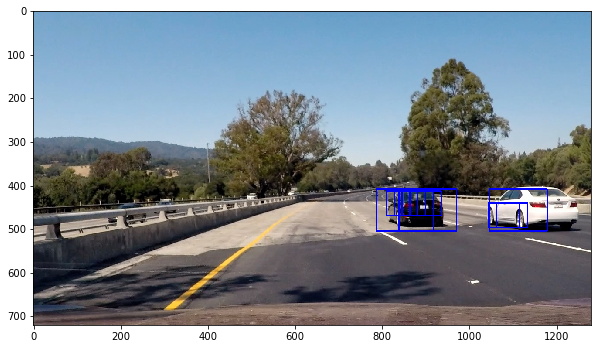

In [537]:
test_images = glob.glob("./test_images/test*.jpg")
env = VehicleDetectionEnv()
env.attach(test_images)

agent = VehicleDetectAgent()
agent.load()

pred = None
i = 0
for s, a, r in env.observation():
    bbox = agent.action_detect(s)
    if len(bbox) == 0:
        continue
    for b in bbox:
        img = cv2.rectangle(s, b[0], b[1], (0,0,255), 2)
    plt.figure(figsize=(10,10))
    plt.imshow(s)
    cv2.imwrite("./output_images/detected_windows_{0}.png".format(i), cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    i += 1
    plt.show()

In [538]:
import os
from moviepy.editor import VideoFileClip

def split_video():
#Split video into frames
    input_video = ['project_video.mp4']
    for v_in_fn in input_video:
        fn = os.path.split(v_in_fn)[1]
        base_name = "./frames"
        if not os.path.exists(base_name):
            os.mkdir(base_name)

        clip = VideoFileClip(v_in_fn)
        clip.to_images_sequence(base_name+"/frame%04d.jpg")
        
split_video()

[MoviePy] Writing frames ./out_frames/frame%04d.jpg.

1260it [00:31, 39.00it/s]            

[MoviePy]: Done writing frames ./out_frames/frame%04d.jpg.



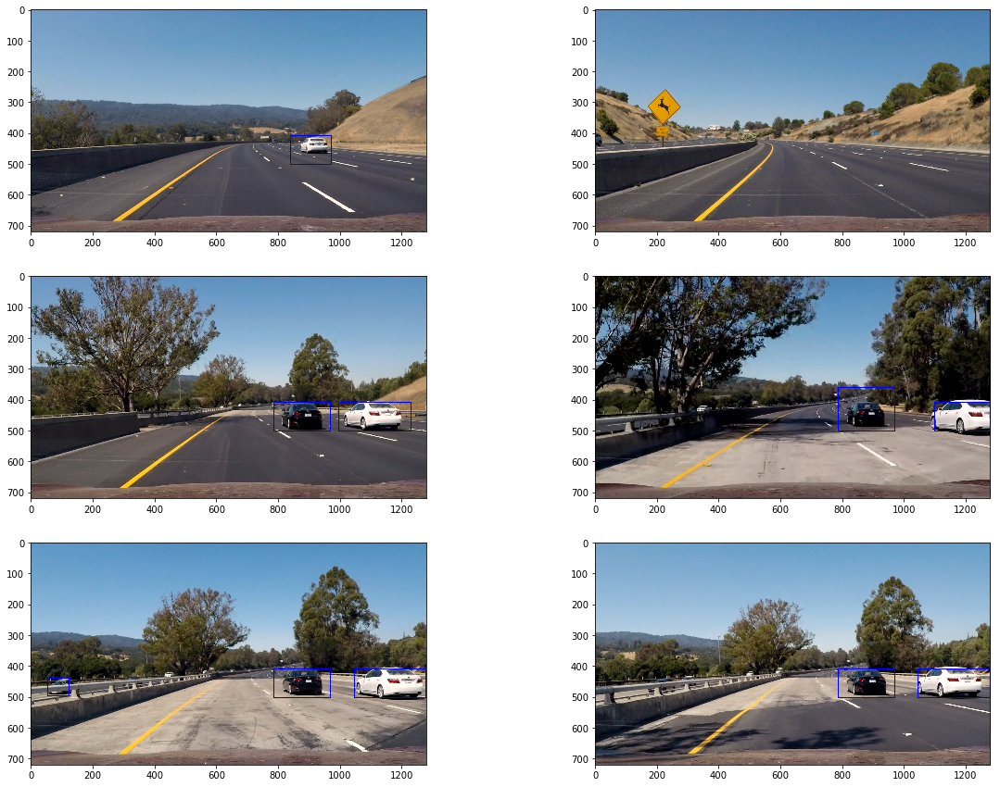

In [592]:
def draw_pipeline(test_images, pipeline, output_fn):
    env = VehicleDetectionEnv()
    env.attach(test_images)
    i = 1
    plt.figure(figsize=(20,15))
    for s, _, _ in env.observation():
        img = pipeline(s)
        plt.subplot(3,2,i)
        plt.imshow(img)
        i+=1
    plt.savefig(output_fn, bbox_inches = "tight")
    plt.show()
    
import sdcp5
draw_pipeline(glob.glob("./test_images/test*.jpg"), sdcp5.pipeline_0, "./output_images/pipeline_00.png")

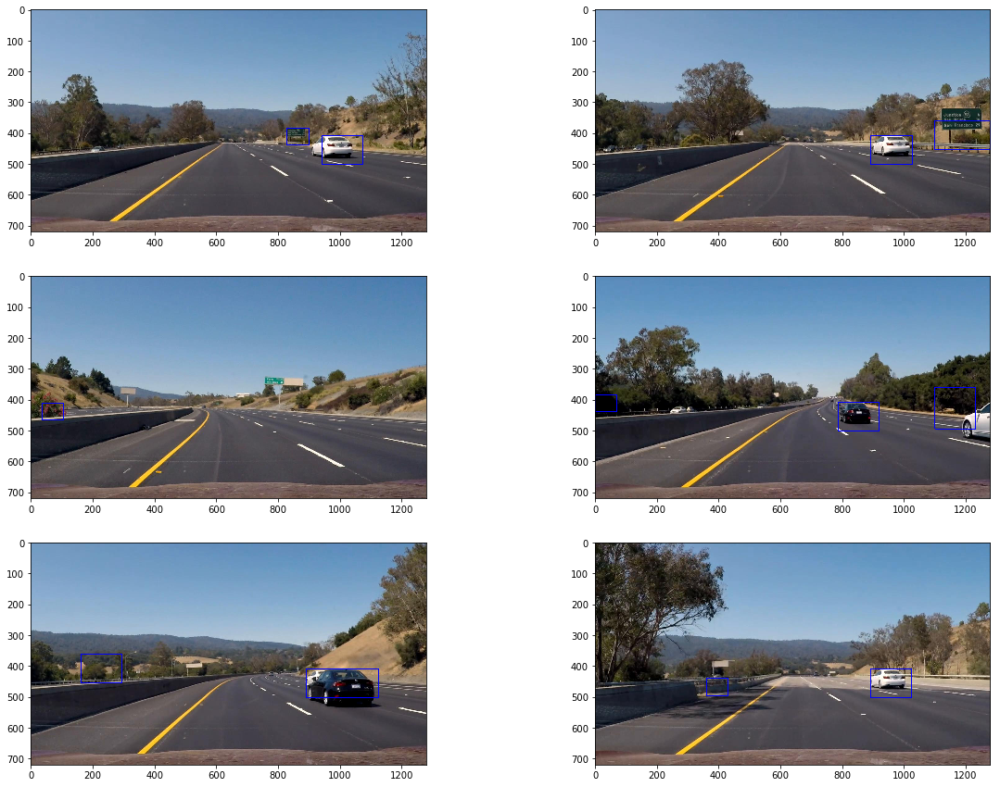

In [593]:
draw_pipeline(glob.glob("./frames_fp1/*.jpg"), sdcp5.pipeline_0, "./output_images/pipeline_01.png")

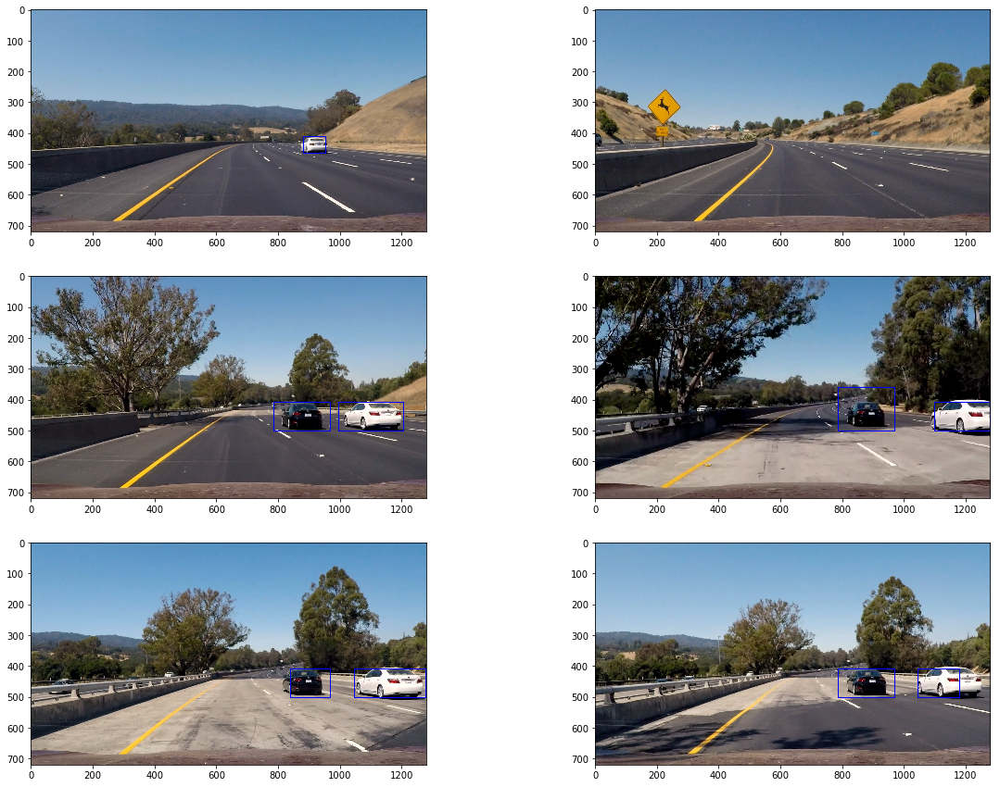

In [594]:
import sdcp5
draw_pipeline(glob.glob("./test_images/test*.jpg"), sdcp5.pipeline_1, "./output_images/pipeline_10.png")

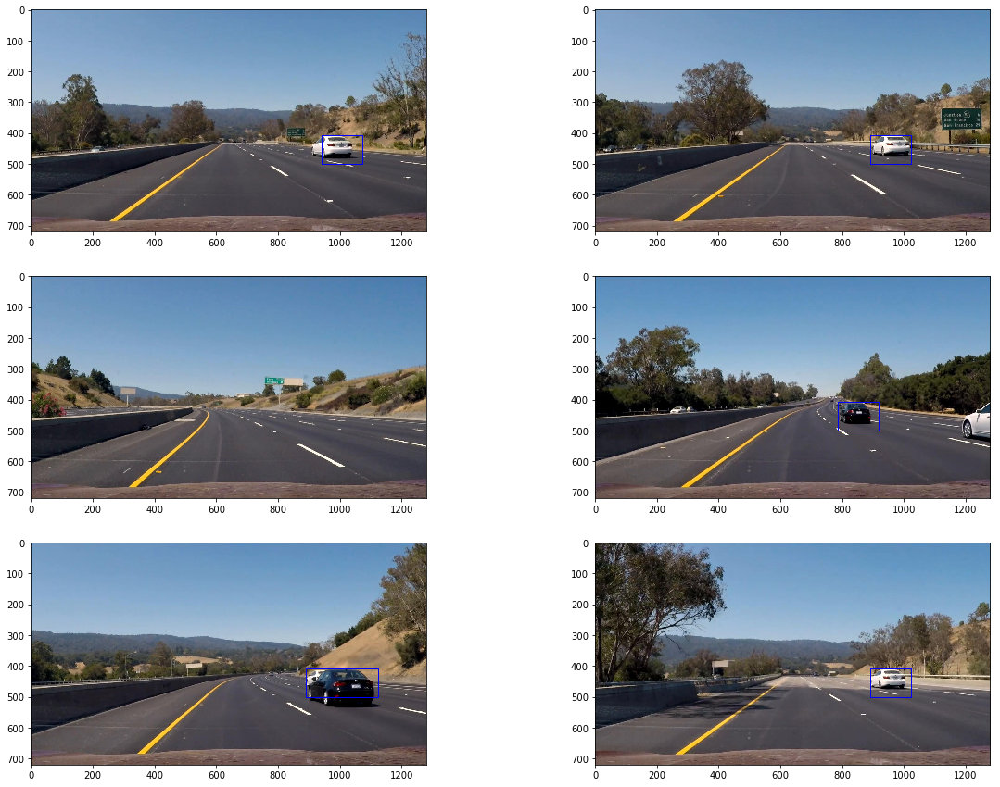

In [595]:
import sdcp5
draw_pipeline(glob.glob("./frames_fp1/*.jpg"), sdcp5.pipeline_1, "./output_images/pipeline_11.png")

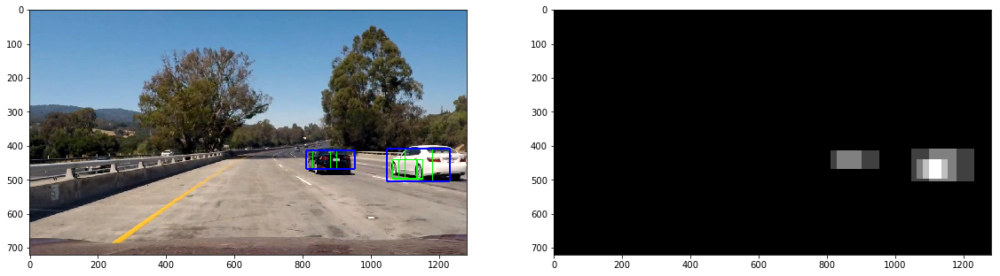

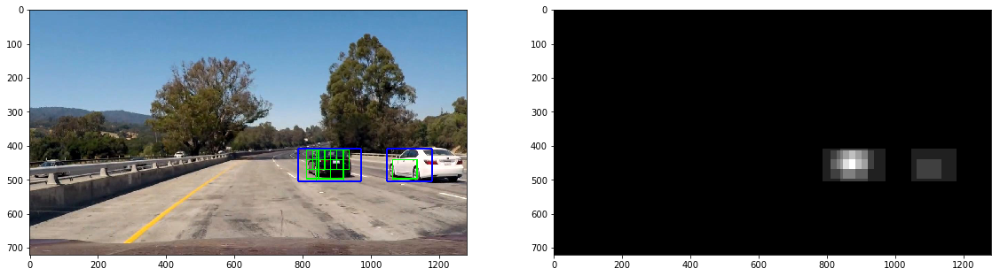

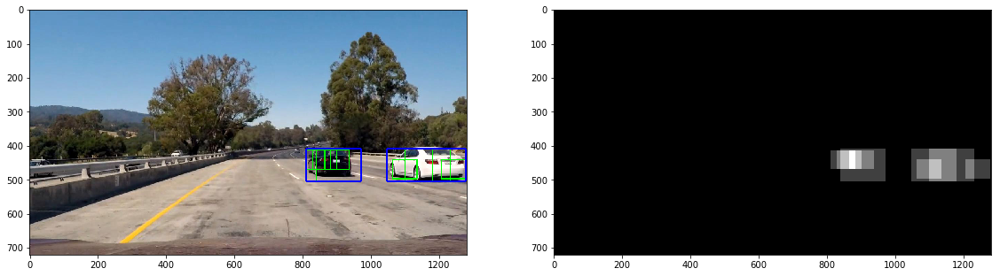

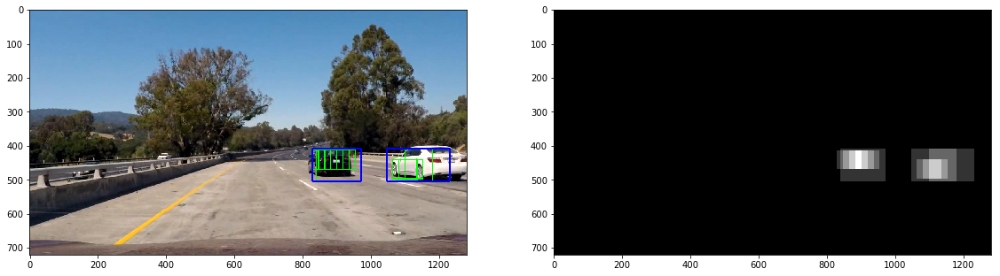

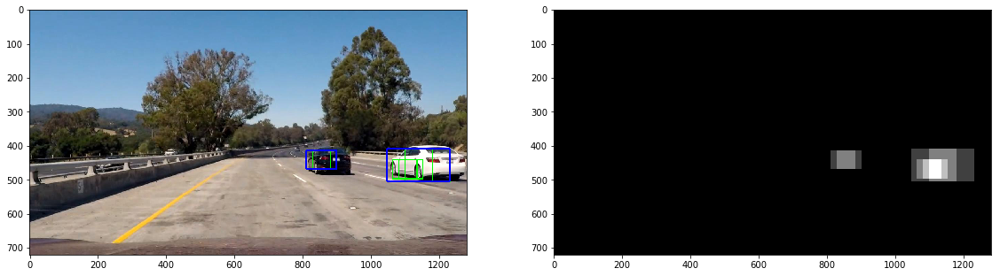

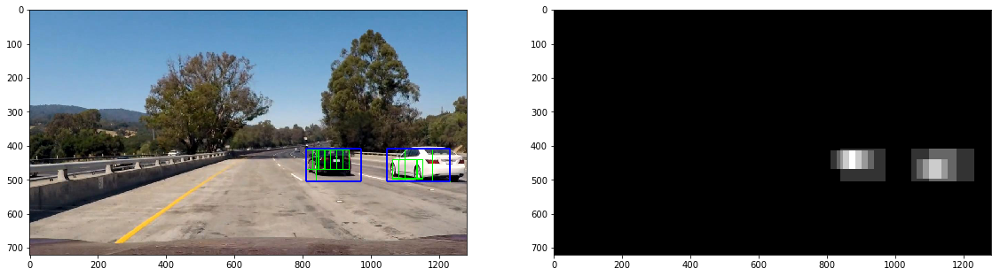

In [604]:
from vd.viz_util import VisualUtil
from scipy.ndimage.measurements import label

viz = VisualUtil()

test_images = glob.glob("./test_images/frame*.jpg")
env = VehicleDetectionEnv()
env.attach(test_images)

agent = VehicleDetectAgent(0.95, 0)
agent.load()

pred = None
i = 0
for s, a, r in env.observation():    
    windows = agent.action_detect(s)
    
    if len(windows) == 0:
        continue

    plt.figure(figsize=(30,15))        
    img = np.copy(s)
    for win in windows:
        img = cv2.rectangle(img, win[0], win[1], (0,255,0), 2)
    
    heatmap = agent.action_heatmap(s, windows)
    labels = label(heatmap)
    
    region = []
    for index in range(1, labels[1]+1):
        nonzero = (labels[0] == index).nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        region.append(bbox)
    
    img = viz.draw_boxes(img, region)

    plt.subplot(1,3,1)
    plt.imshow(img)

    plt.subplot(1,3,2)
    plt.imshow(heatmap, cmap='gray')
    plt.savefig("./output_images/heatmap_{0}.png".format(i), bbox_inches = "tight")
    plt.show()
    cv2.imwrite("./output_images/result_{0}.png".format(i), cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    i += 1

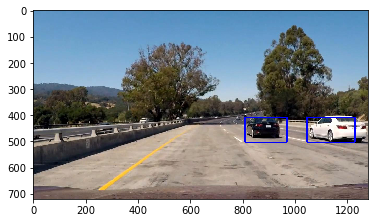

True

In [607]:
img = viz.draw_boxes(s, region)
plt.imshow(img)
plt.show()
cv2.imwrite("./output_images/final.png".format(i), cv2.cvtColor(img, cv2.COLOR_RGB2BGR))